<a href="https://colab.research.google.com/github/banned-books/project_banned_books/blob/main/transfer_visual_similarity/Keras_transfer_learning_models_analysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Mount Google Drive

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive/')

Drive already mounted at /content/gdrive/; to attempt to forcibly remount, call drive.mount("/content/gdrive/", force_remount=True).


# Import Libraries

In [ ]:
# Standard packages
import pandas as pd
import inspect
from tqdm import tqdm
import numpy as np
import random
import os
import re
from threading import Thread
import time
import warnings
import difflib
from dataclasses import dataclass

# Visualization & Colab packages
import matplotlib.pyplot as plt
from wordcloud import WordCloud
from yellowbrick.features import PCA
import plotly.express as px
import plotly.io as pio
import plotly.graph_objects as go
from plotly.subplots import make_subplots
pio.renderers.default = 'colab'

# Diminsionality reduction and machine learning packages
import umap
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import silhouette_score
from yellowbrick.cluster import KElbowVisualizer, SilhouetteVisualizer, InterclusterDistance
import tensorflow as tf
from tensorflow import keras
from keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications.vgg16 import VGG16
from tensorflow.keras.applications.inception_v3 import InceptionV3
from tensorflow.keras.applications.resnet50 import ResNet50
from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img, img_to_array
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.utils import Sequence, to_categorical, plot_model
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Conv2D, MaxPooling2D, GlobalAveragePooling2D, Activation, Dropout, Flatten, Dense, Input, Layer, GlobalMaxPooling2D
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau
from sklearn.neighbors import KNeighborsClassifier

pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
warnings.filterwarnings("ignore")

# List all available pre-trained Keras models

In [ ]:
model_dictionary = {m[0]:m[1] for m in inspect.getmembers(tf.keras.applications, inspect.isfunction)}

# Load & Pre-process Custom Book Cover Images Data

These books have book cover images. 

In [ ]:
df = pd.read_csv('/content/gdrive/MyDrive/Colab Notebooks/data/cleaned_trained_data/data.csv')

### Check for null values

In [ ]:
df.isnull().sum()

Unnamed: 0                     0
goodreads_image_url            0
title                          0
author                         0
goodreads_published_date       0
goodreads_description          0
goodreads_tags                 0
type_of_ban                    0
state                          0
district                       0
ban_date                       0
origin_of_challenge            0
goodreads_product_url          0
amazon_url                    99
secondary_authors           1496
illustrators                1153
translators                 1588
id                             0
dtype: int64

### Create image id and filename column

In [ ]:
df['id'] = df['id'].astype(str)
df['filename'] = df['id'].apply(lambda x: os.path.join("/content/gdrive/MyDrive/book_cover_images", x))
df['filename'] = df['filename'] + '.jpg'
df['id'] = df['id'].astype(int)

### Create image generators

The splits are for future work with labeled target data. As an unsupervised clustering approach, we don't have target data/labels at the moment.

In [ ]:
data = df.sample(frac=1).reset_index(drop=True)
n = len(data)
train = data.iloc[:int(n*0.8),:]
val = data.iloc[int(n*0.8):,:].reset_index(drop=True)

In [ ]:
# Initialize Keras' ImageDataGenerator class
datagen = ImageDataGenerator(rescale=1/255.)

# Initialize the training, validation, and testing generator
train_generator = datagen.flow_from_dataframe(
    dataframe=train,
    target_size=(256,256),
    x_col='filename',
    class_mode=None,
    batch_size=32,
    shuffle=False,
    classes=['images'],
    seed=42
)

val_generator = datagen.flow_from_dataframe(
    dataframe=val,
    target_size=(256,256),
    x_col='filename',
    class_mode=None,
    batch_size=32,
    shuffle=False,
    classes=['images'],
    seed=42
)

data_generator = datagen.flow_from_dataframe(
    dataframe=data,
    target_size=(256,256),
    x_col='filename',
    class_mode=None,
    batch_size=32,
    shuffle=False,
    classes=['images'],
    seed=42
)

Found 1291 validated image filenames.
Found 323 validated image filenames.
Found 1614 validated image filenames.


# Keras Pre-trained Base Models

In [ ]:
def vggModel():
    """Return the pre-trained VGG16 model."""
    
    model = VGG16(weights='imagenet', include_top=False, input_shape = (224, 224, 3))

    return model

In [ ]:
def resNetModel():
    """Return the pre-trained ResNet50 model."""
    
    model = ResNet50(weights='imagenet', include_top=False, input_shape = (224, 224, 3))
    
    return model

In [ ]:
def inceptionV3Model():
    """Return the pre-trained InceptionV3 model."""

    base = InceptionV3(include_top=True, weights='imagenet',)
    model = Model(inputs=base.input, outputs=base.get_layer('avg_pool').output)

    model.summary()
    
    return model

## Pick the Keras Pre-trained Model To Use

Examples:

* `vggModel` for VGG16
* `resNetModel` for ResNet50
* **`inceptionV3Model` for InceptionV3 - fastest and best performing model and therefore the best model for PixPlot, an online WebGL site building tool, that could otherwise take too long to build with some other pre-trained Keras models**



In [ ]:
model = inceptionV3Model()
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 299, 299, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 149, 149, 32  864         ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization (BatchNorm  (None, 149, 149, 32  96         ['conv2d[0][0]']                 
 alization)                     )                                                             

# Feature Extraction from the Chosen Pre-trained Model

In [ ]:
train_features = model.predict(train_generator, verbose=1)
val_features = model.predict(val_generator, verbose=1)
data_features = model.predict(data_generator, verbose=1)

51/51 [==============================] - 40s 784ms/step


## We need to figure out these PixPlot parameters via UMAP and KMeans

**`--n_clusters`**

parser.add_argument('--n_clusters', type=int, default=config['n_clusters'], help='number of clusters to use when clustering with kmeans')


**`--n_neighbors`**

parser.add_argument(nargs='+', type=int, default=config['n_neighbors'], help='the n_neighbors arguments for UMAP')

**`--min_dist`**

parser.add_argument('--min_dist', nargs='+', type=float, default=config['min_dist'], help='the min_dist arguments for UMAP')

**`--n_components`**

--parser.add_argument('--n_components', type=int, default=config['n_components'], help='the n_components argument for UMAP')

**`--metric`** 

parser.add_argument('--metric', type=str, default=config['metric'], help='the metric argument for UMap')


# Apply UMAP Feature Decomposition

### First, scale the image data

In [ ]:
scaler = StandardScaler()
scaled = scaler.fit_transform(data_features)

scaled = pd.DataFrame(scaled)
scaled.head(2)

X = scaled
X = X.dropna()
y = data['id']

### Test/Tune the UMAP Dimensionality Reduction Parameters

Let's figure out how many `n_neighbors` to use.

From UMAP documentation: https://umap-learn.readthedocs.io/en/latest/parameters.html

In [ ]:
def create_umap(n_neighbors=n, min_dist=0.1, n_components=2, metric="correlation", random_state=42, title=''):
    '''Return UMap with given parameters.'''

    dim = umap.UMAP(
        n_neighbors=n, min_dist=0.1, n_components=2, metric="correlation", random_state=42,
    ).fit_transform(scaled)

    dim_df = pd.DataFrame(
        dim,
        columns=['u' + str(i) for i in range(dim.shape[1])],
        index=scaled.index,
    )

    fig = px.scatter(
      dim_df,
      x="u0",
      y="u1",
    )

    return fig.show()

In [ ]:
for n in (2, 3, 4, 5, 8, 10, 12):
    create_umap(n_neighbors=n, title='n_neighbors = {}'.format(n))

**An `n_neighbors` of 5 looks good.**

Let's figure out how what `min_dist` to use. We'll want to keep to a lower value for clustering purposes.

In [ ]:
for d in (0.0, 0.01, 0.1, 0.25, 0.5, 0.8, 0.99):
    create_umap(min_dist=d, title='min_dist = {}'.format(d))

**Let's use `min_dist = 0.01`.**

Now, let's figure out what `n_components` to use.

In [ ]:
for c in (1, 2):
  create_umap(n_components=c, title='n_components = 1')


**Let's use `n_components=2`.**

Finally, let's pick the `metric` to use between: correlation, cosine, mahalanobis, wminkowski, etc..

**By running each of these, we decided to use `metric=correlation`.**

In [ ]:
for m in ('correlation'):
    create_umap(n_components=2, metric=m, title='metric = {}'.format(m))

## Draw the UMAP with our tuned parameters

In [ ]:
# Our chosen UMAP parameters
n_neighbors = 5
min_dist = 0.01
n_components = 2
metric='correlation'
seed = 42

def draw_chosen_umap(n_components=n_components, n_neighbors=n_neighbors, min_dist=min_dist, metric=metric, random_state=seed):
    '''Draw UMAP with tuned parameters.'''

    dim = umap.UMAP(
        n_components=n_components, n_neighbors=n_neighbors, min_dist=min_dist, metric=metric, random_state=seed
    ).fit_transform(scaled)

    dim_df = pd.DataFrame(
        dim,
        columns=['u' + str(i) for i in range(dim.shape[1])],
        index=scaled.index,
    )

    fig = px.scatter(
      dim_df,
      x="u0",
      y="u1",
      title="UMAP Final Results in Two Dimensions",
    )

    return fig.show()

In [ ]:
draw_chosen_umap(
    n_neighbors=n_neighbors, 
    min_dist=min_dist, 
    n_components=n_components, 
    metric=metric, 
    random_state=seed
)

# KMeans Clustering of Book Cover Images (Unsupervised)


We need to find the number of kmeans clusters as the final parameter for our clustering and PixPlot output.

**`--n_clusters`**

parser.add_argument('--n_clusters', type=int, default=config['n_clusters'], help='number of clusters to use when clustering with kmeans')



---
Parameters we already know.

**`--n_neighbors` 5**

parser.add_argument(nargs='+', type=int, default=config['n_neighbors'], help='the n_neighbors arguments for UMAP')

**`--min_dist` 0.01**

parser.add_argument('--min_dist', nargs='+', type=float, default=config['min_dist'], help='the min_dist arguments for UMAP')

**`--n_components` 2**

--parser.add_argument('--n_components', type=int, default=config['n_components'], help='the n_components argument for UMAP')

**`--metric` correlation** 

parser.add_argument('--metric', type=str, default=config['metric'], help='the metric argument for UMap')


**`--seed` 42** 

parser.add_argument('--seed', type=int, default=config['seed'], help='seed for random processes')

**`--images "/content/drive/MyDrive/book_cover_images/*"`**

parser.add_argument('--images', '-i', type=str, default=config['images'], help='path to a glob of images to process', required=False)

**`--metadata "/content/drive/MyDrive/Colab_Notebooks/data/cleaned_trained_data/metadata.csv"`** 

parser.add_argument('--metadata', '-m', type=str, default=config['metadata'], help='path to a csv or glob of JSON files with image metadata (see readme for format)', required=False)

## Select the number K to decide the number of clusters for KMeans

In [ ]:
for k in range(2, 30, 1):
    pred = KMeans(n_clusters=k, random_state=42).fit_predict(scaled)

    print(
        'Silhouette score for {} cluster using k-means: {}'.format(
            k, silhouette_score(scaled, pred, metric="euclidean")
        )
    )

Silhouette score for 2 cluster using k-means: 0.06502733379602432
Silhouette score for 3 cluster using k-means: 0.007487482391297817
Silhouette score for 4 cluster using k-means: -0.023846976459026337
Silhouette score for 5 cluster using k-means: -0.027464473620057106
Silhouette score for 6 cluster using k-means: -0.029253939166665077
Silhouette score for 7 cluster using k-means: -0.023401787504553795
Silhouette score for 8 cluster using k-means: -0.03063018061220646
Silhouette score for 9 cluster using k-means: -0.032344188541173935
Silhouette score for 10 cluster using k-means: -0.03207150101661682
Silhouette score for 11 cluster using k-means: -0.028711475431919098
Silhouette score for 12 cluster using k-means: -0.03608222305774689
Silhouette score for 13 cluster using k-means: -0.03644328564405441
Silhouette score for 14 cluster using k-means: -0.03641549125313759
Silhouette score for 15 cluster using k-means: -0.028329981490969658
Silhouette score for 16 cluster using k-means: -0.

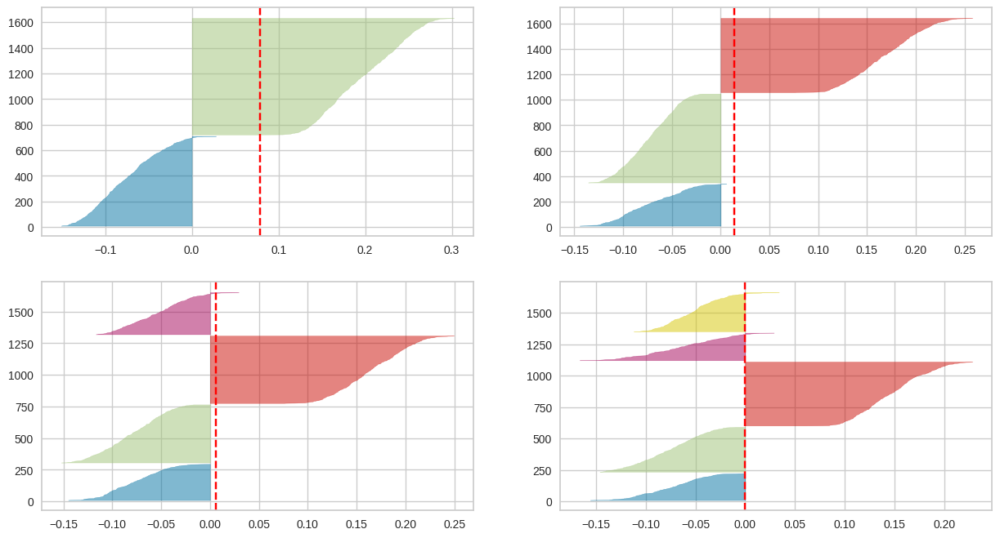

In [ ]:
fig, ax = plt.subplots(2, 2, figsize=(15,8))

for i in [2, 3, 4, 5]:
    '''
    Create KMeans instance for different number of clusters
    '''
    km = KMeans(n_clusters=i, n_init='auto', random_state=42)
    q, mod = divmod(i, 2)

    '''
    Create SilhouetteVisualizer instance with KMeans instance &
    fit the visualizer
    '''
    visualizer = SilhouetteVisualizer(km, colors='yellowbrick', ax=ax[q-1][mod])
    visualizer.fit(X)

**So, for our images, the number of clusters is `k=2`.** Let's review some more evaluation metrics.

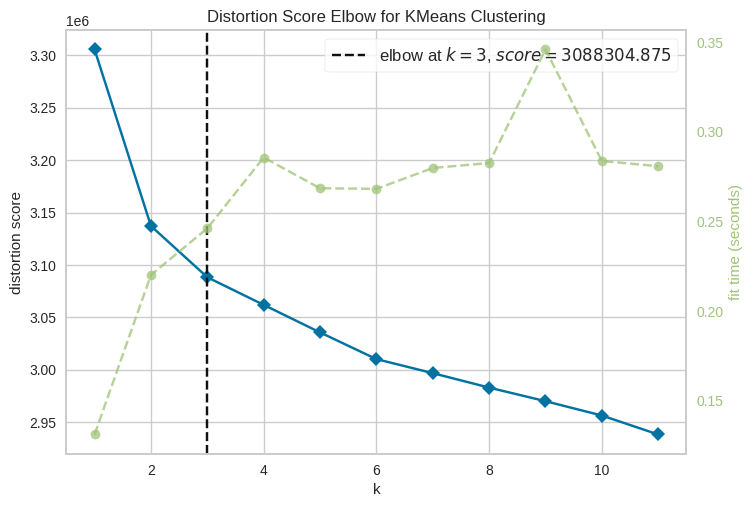

In [ ]:
# Instantiate the clustering model and visualizer
model = KMeans(n_init='auto', random_state=42)
visualizer = KElbowVisualizer(model, k=(1,12))

visualizer.fit(X)        # Fit the data to the visualizer
visualizer.show();        # Finalize and render the figure

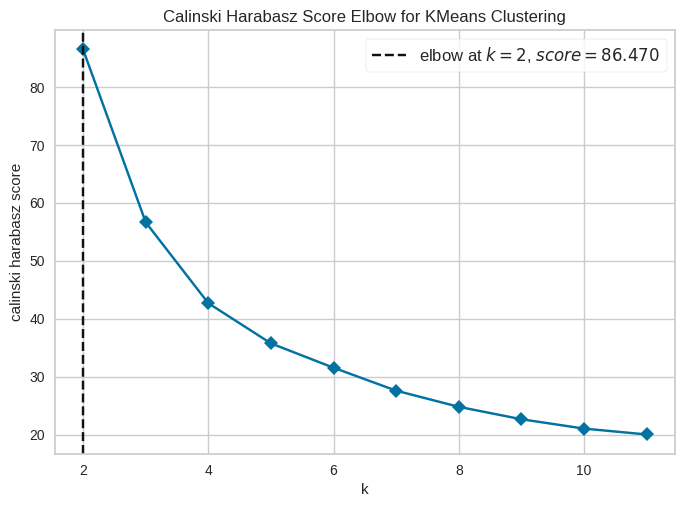

In [ ]:
# Instantiate the clustering model and visualizer
visualizer = KElbowVisualizer(
    model, k=(2,12), metric='calinski_harabasz', timings=False
)

visualizer.fit(X)        # Fit the data to the visualizer
visualizer.show();        # Finalize and render the figure

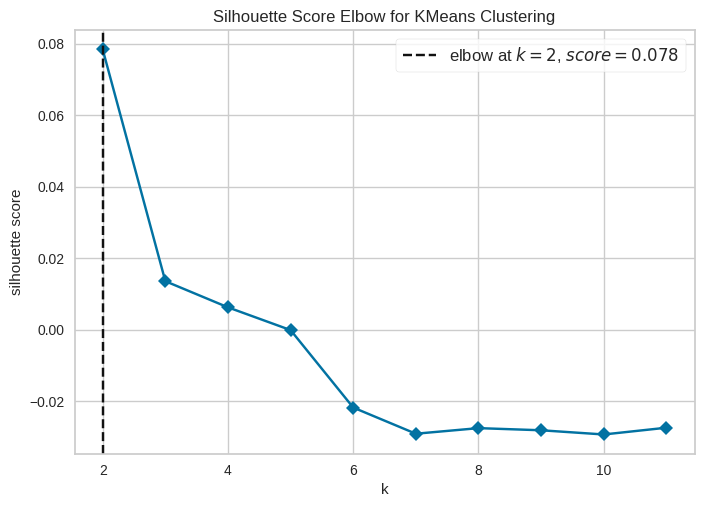

In [ ]:
# Instantiate the clustering model and visualizer
visualizer = KElbowVisualizer(
    model, k=(2,12), metric='silhouette', timings=False
)

visualizer.fit(X)        # Fit the data to the visualizer
visualizer.show();        # Finalize and render the figure

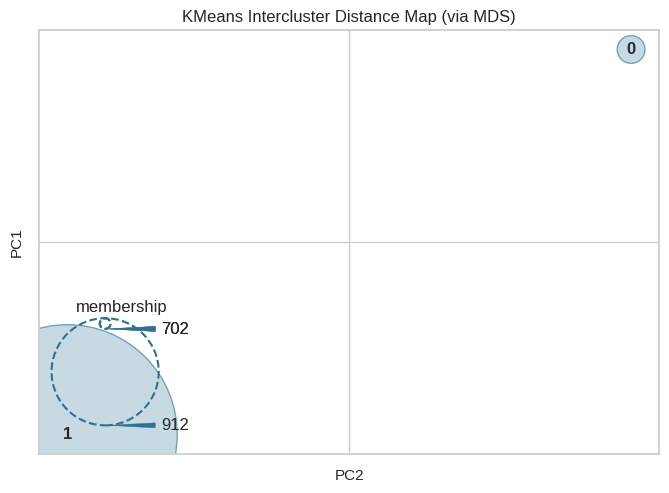

In [ ]:
# Instantiate the clustering model and visualizer
model = KMeans(2, n_init='auto', random_state=42)

visualizer = InterclusterDistance(model)

visualizer.fit(X)        # Fit the data to the visualizer
visualizer.show();        # Finalize and render the figure

In [ ]:
# We can tell it how many clusters we're aiming for
kmeans = KMeans(n_init='auto', n_clusters=2, random_state=42)

# .fit_predict() is relevant to unsupervised learning where we don't have labelled inputs 
label = kmeans.fit_predict(scaled)

In [ ]:
print('Total number of clusters', kmeans.n_clusters) # total count of clusters
print('===========')
print('Cluster centers', kmeans.cluster_centers_) # clusters' centers
print('===========')
print('Labels for each observation', kmeans.labels_) # a label for each observation
print('===========')
print('Sum of the error, inertia', kmeans.inertia_) # we can say sum of error

Total number of clusters 2
Cluster centers [[ 0.18647747  0.31585494  0.400351   ...  0.1191078   0.230811
  -0.11871986]
 [-0.1435386  -0.24312523 -0.3081649  ... -0.09168172 -0.17766374
   0.09138307]]
Labels for each observation [1 1 1 ... 0 1 0]
Sum of the error, inertia 3137188.75


## Select the centroids and graph with the clusters

In [ ]:
scaled_df = pd.DataFrame(scaled)

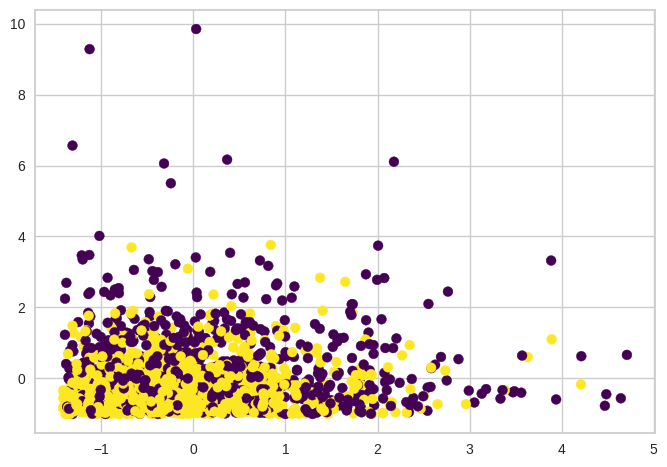

In [ ]:
plt.scatter(scaled_df.iloc[:, 0],
scaled_df.iloc[:, 1],
c=kmeans.labels_,
s=50,
cmap="viridis")
plt.show()

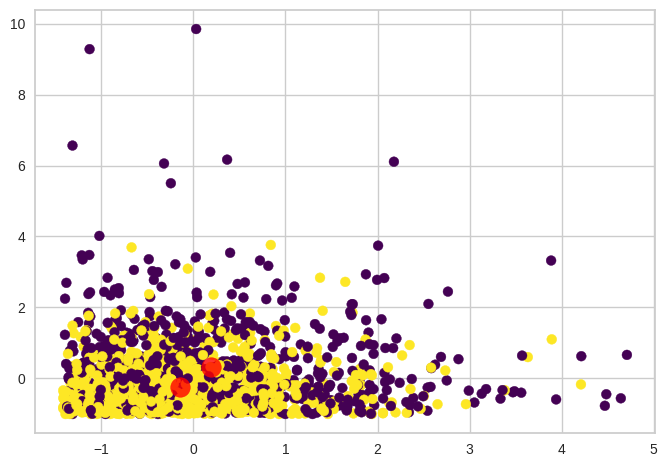

In [ ]:
# getting centroids
centroids = kmeans.cluster_centers_ 

# plotting the data by 1st and 2nd dimensions
plt.scatter(scaled_df.iloc[:, 0],
scaled_df.iloc[:, 1],
c=kmeans.labels_,
s=50,
cmap="viridis")

# plotting the centroids
plt.scatter(centroids[:, 0],
centroids[:, 1],
c="red",
s=200,
alpha=0.8)

plt.show()

## Calculate Inertia

A good model is one with low inertia AND a low number of clusters ( K ).

In [ ]:
inertias = []
cluster_range = range(1,5)

In [ ]:
for cluster_count in cluster_range:
    kmeans = KMeans(n_init='auto', n_clusters=cluster_count).fit(scaled_df)
    inertias.append(kmeans.inertia_)

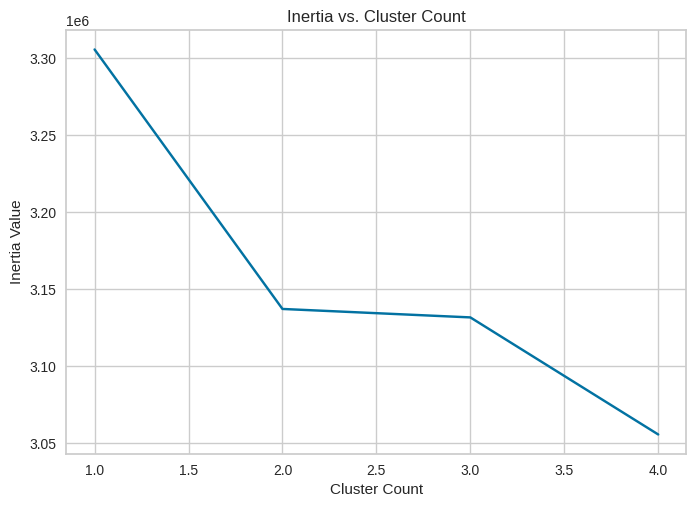

In [ ]:
plt.plot(cluster_range, inertias)
plt.xlabel("Cluster Count")
plt.ylabel('Inertia Value')
plt.title("Inertia vs. Cluster Count")
plt.show()

# KMeans Analysis of Image Clusters and Associated Banned Book Genres

## Bar Graph Topic Word Frequencies within the Two Image Clusters (determined by KMeans)

In [ ]:
model = KMeans(n_clusters=2, n_init='auto', random_state=42)
model.fit_predict(scaled_df)
data['Label'] = model.labels_
data['Label'].value_counts()

cluster_tags = data.groupby('Label').goodreads_tags.apply(
    lambda x: x.unique().tolist()
  )

test = cluster_tags.to_frame().reset_index()

df = test.set_index(['Label']).apply(pd.Series.explode).reset_index()
df['goodreads_tags'] = df['goodreads_tags'].str.split(',')                                                               
df = df.explode('goodreads_tags')
df['goodreads_tags'] = df['goodreads_tags'].str.strip().replace(' ', '')

In [ ]:
# Clean up genre tags that are empty or repetitive tags
L = [' ', ' contemporary', ' audiobook',
 'contemporary', ' realistic fiction', '', 
 'realistic fiction', ' contemporary', 'young adult contemporary']

df = df[~df.goodreads_tags.isin(L)]

In [ ]:
cluster_1_df = df[df['Label'] == 0]
cluster_2_df = df[df['Label'] == 1]

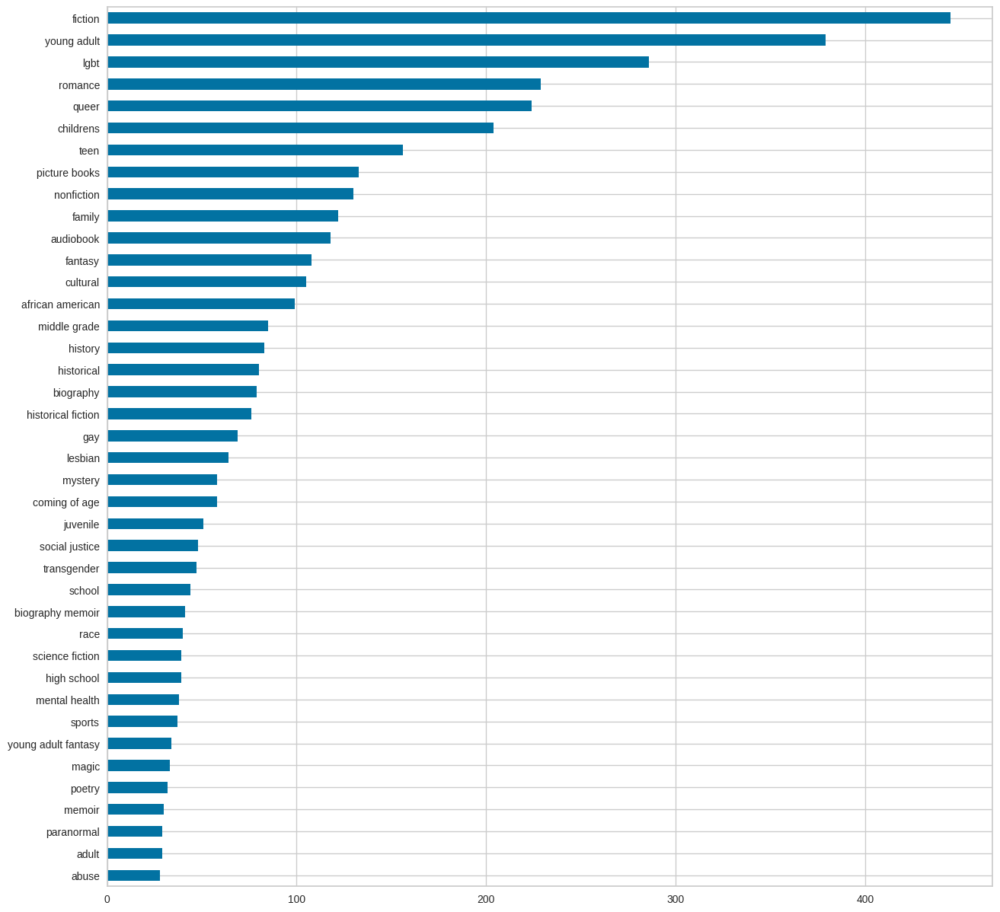

In [ ]:
cluster_1_df['goodreads_tags'].value_counts().iloc[:40].sort_values(ascending=True).plot.barh(figsize=(15,15));

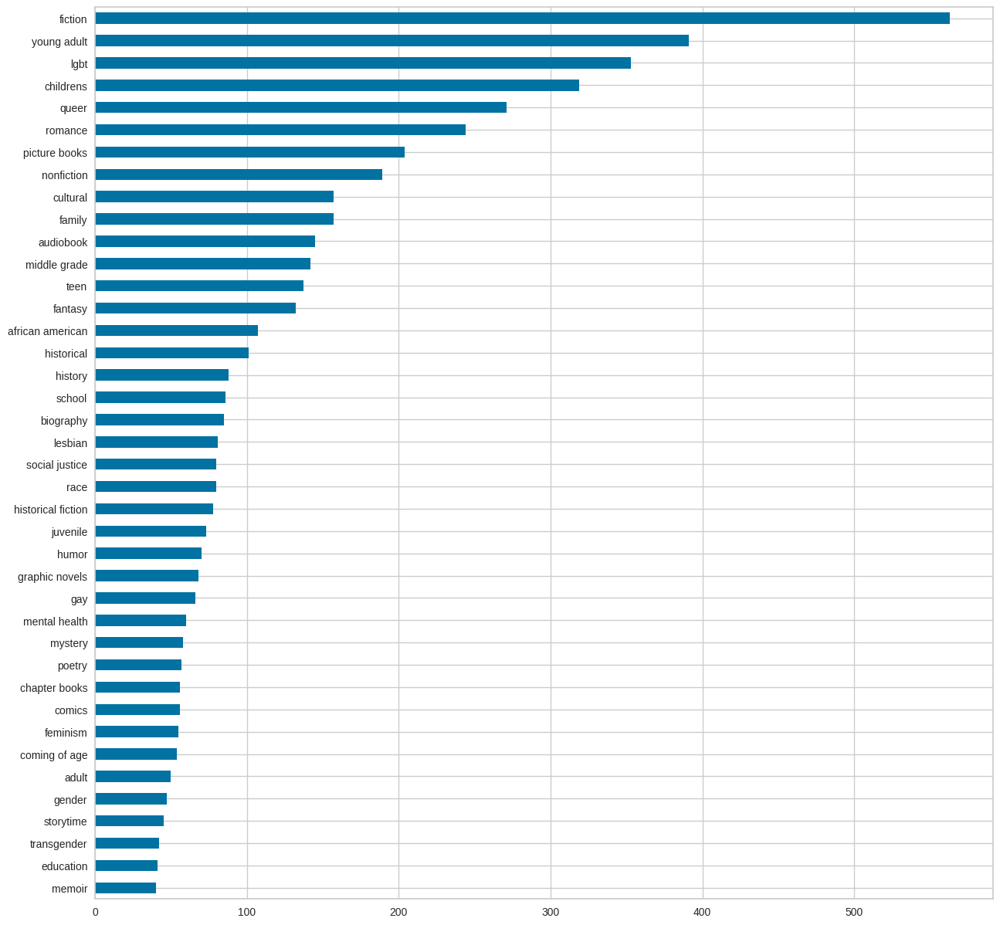

In [ ]:
cluster_2_df['goodreads_tags'].value_counts().iloc[:40].sort_values(ascending=True).plot.barh(figsize=(15,15));

## What are the differences/similarities between the two image clusters and their banned book topics therein?

### Find Similar Genres in Cluster 1 and 2

In [ ]:
clust_1 = cluster_1_df['goodreads_tags'].value_counts().sort_values(ascending=False)
clus_1_df = clust_1.to_frame().reset_index()
clusters_1 = clus_1_df['index'].to_list()
clus_1_df = clus_1_df.rename(columns={'index': 'goodreads_tags', 'goodreads_tags': 'clus_1_count'})

In [ ]:
clust_2 = cluster_2_df['goodreads_tags'].value_counts().sort_values(ascending=False)
clus_2_df = clust_2.to_frame().reset_index()
clusters_2 = clus_2_df['index'].to_list()
clus_2_df = clus_2_df.rename(columns={'index': 'goodreads_tags', 'goodreads_tags': 'clus_2_count'})

#### Fuzzy match the text (to account for similar topics that can be merged together)



In [ ]:
# Fuzzymatch Method Credit to https://stackoverflow.com/questions/74778263/python-merge-two-dataframe-based-on-text-similarity-of-their-columns
@dataclass()
class FuzzyMerge:
    """
        Works like pandas merge except also merges on approximate matches.
    """
    left: pd.DataFrame
    right: pd.DataFrame
    left_on: str
    right_on: str
    how: str = "inner"
    cutoff: float = 0.3

    def main(self) -> pd.DataFrame:
        temp = self.right.copy()
        temp[self.left_on] = [
            self.get_closest_match(x, self.left[self.left_on]) for x in temp[self.right_on]
        ]

        return self.left.merge(temp, on=self.left_on, how=self.how)

    def get_closest_match(self, left: pd.Series, right: pd.Series) -> str or None:
        matches = difflib.get_close_matches(left, right, cutoff=self.cutoff)

        return matches[0] if matches else None

merged = FuzzyMerge(left=clus_1_df, right=clus_2_df, left_on="goodreads_tags", right_on="goodreads_tags").main()
merged = merged.drop_duplicates(subset=['goodreads_tags'])[:24]

In [ ]:
merged = FuzzyMerge(left=clus_1_df, right=clus_2_df, left_on="goodreads_tags", right_on="goodreads_tags").main()
merged = merged.drop_duplicates(subset=['goodreads_tags'])[:24]

#### Create the multi-bar graph (horizontal)

In [ ]:
# create subplots
fig = make_subplots(rows=1, cols=2, specs=[[{}, {}]], shared_xaxes=False,
                    shared_yaxes=True, horizontal_spacing=0)

fig.append_trace(go.Bar(x=merged['clus_1_count'],
                     y=merged['goodreads_tags'], 
                     text=merged["clus_1_count"].map('{:,.0f}'.format), #Display the numbers with thousands separators in hover-over tooltip 
                     textposition='inside',
                     orientation='h',
                     width=0.7, 
                     showlegend=False, 
                     marker_color='lightsalmon'), 
                     1, 1) # 1,1 represents row 1 column 1 in the plot grid

fig.append_trace(go.Bar(x=merged['clus_2_count'],
                     y=merged['goodreads_tags'], 
                     text=merged["clus_2_count"].map('{:,.0f}'.format),
                     textposition='inside',
                     orientation='h', 
                     width=0.7, 
                     showlegend=False, 
                     marker_color='#7adeff'), 
                     1, 2) # 1,2 represents row 1 column 2 in the plot grid

fig.update_xaxes(showticklabels=False, title_text="Cluster 1 Count")
fig.update_xaxes(showticklabels=False, title_text="Cluster 2 Count")

fig.update_layout(title_text="Top Topic Counts within Both Clusters", 
                  width=800, 
                  height=1000,
                  title_x=0.50,
                  xaxis1={'side': 'top'},
                  xaxis2={'side': 'top'},)


fig.update_layout(yaxis=dict(autorange="reversed"))


fig.show()

### What topics does cluster 1 have that cluster 2 doesn't, and vice versa?

#### Wordcloud Creation Method

In [ ]:
def cluster_wordcloud(cluster_genres, plot_name):
  '''Return a wordcloud.'''
  
  #convert list to string and generate
  unique_string=(" ").join(cluster_genres)
  wordcloud = WordCloud(width = 1000, height = 500).generate(unique_string)
  
  plt.figure(figsize=(15,8))
  plt.imshow(wordcloud)
  plt.axis("off")
  plt.savefig(plot_name +".png", bbox_inches='tight')

  return plt.show()

#### What topics does cluster 1 have that cluster 2 does not?

In [ ]:
clus_1_unique_lst = list(set(clusters_1) - set(clusters_2))
clust_1_unique_df = clus_1_df[clus_1_df['goodreads_tags'].isin(clus_1_unique_lst)]
clust_1_unique_df = clust_1_unique_df.sort_values(by=['clus_1_count'], ascending=False)[:17]

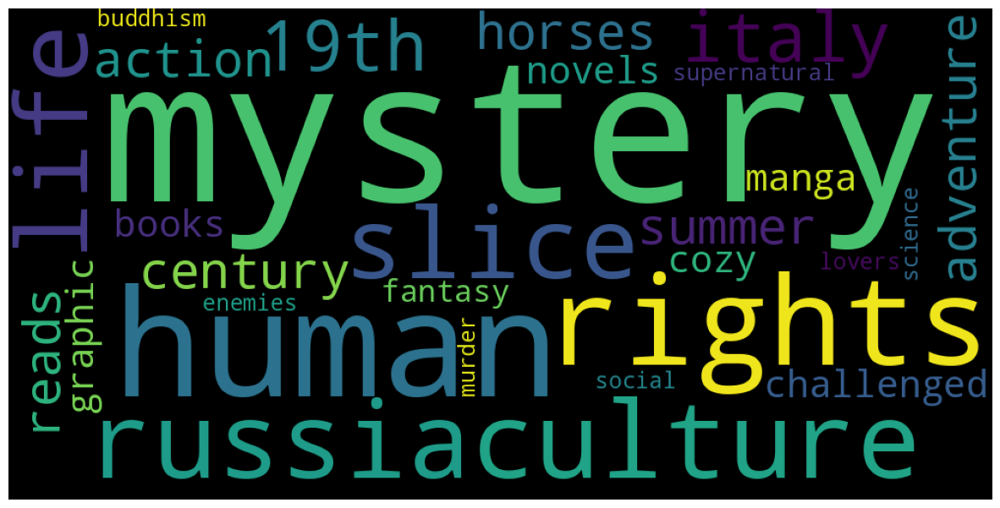

In [ ]:
cluster_wordcloud(clust_1_unique_df['goodreads_tags'], "Cluster_1_Unique_Topics")

#### What topics does cluster 2 have that cluster 1 does not?

In [ ]:
clus_2_unique_lst = list(set(clusters_2) - set(clusters_1))
clust_2_unique_df = clus_2_df[clus_2_df['goodreads_tags'].isin(clus_2_unique_lst)]
clust_2_unique_df = clust_2_unique_df.sort_values(by=['clus_2_count'], ascending=False)[:17]

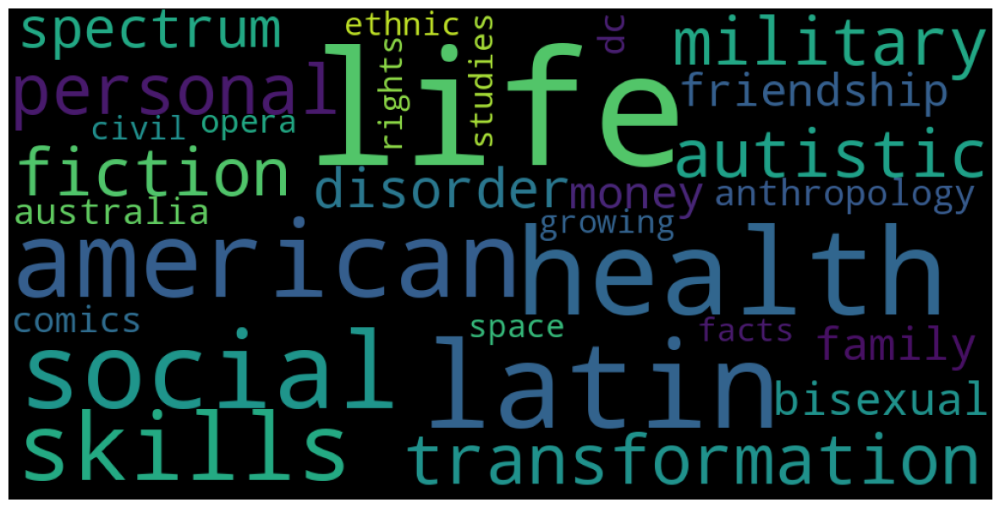

In [ ]:
cluster_wordcloud(clust_2_unique_df['goodreads_tags'], "Cluster_2_Unique_Topics")

# Build the PixPlot

**To build the PixPlot with our tuned parameters, please run [this Colab notebook](https://colab.research.google.com/drive/1tznvHcwephlZ3SvIILWCp2sb5iLHXk6e) with free GPUs and follow the directions therein.** 

**Parameters we know to use for our PixPlot.**

**--n_clusters 2**

parser.add_argument('--n_clusters', type=int, default=config['n_clusters'], help='number of clusters to use when clustering with kmeans')

**--n_neighbors 5**

parser.add_argument(nargs='+', type=int, default=config['n_neighbors'], help='the n_neighbors arguments for UMAP')

**--min_dist 0.01**

parser.add_argument('--min_dist', nargs='+', type=float, default=config['min_dist'], help='the min_dist arguments for UMAP')

**--n_components 2**

--parser.add_argument('--n_components', type=int, default=config['n_components'], help='the n_components argument for UMAP')

**--metric 'correlation'**

parser.add_argument('--metric', type=str, default=config['metric'], help='the metric argument for UMap')

**--seed 42**

parser.add_argument('--seed', type=int, default=config['seed'], help='seed for random processes')

**--images "/content/drive/MyDrive/book_cover_images/*"**

parser.add_argument('--images', '-i', type=str, default=config['images'], help='path to a glob of images to process', required=False)

**--metadata "/content/drive/MyDrive/Colab_Notebooks/data/cleaned_trained_data/metadata.csv"**

parser.add_argument('--metadata', '-m', type=str, default=config['metadata'], help='path to a csv or glob of JSON files with image metadata (see readme for format)', required=False)



---



---



---



---



---



# Appendix

## Proof of Concept a Visual Similarity Recommendation System

We did not proceed with this hackathon/proof of concept for the ethical reasons highlighted in our blog post.

## Pick the [similarity distance metric](https://scikit-learn.org/stable/modules/generated/sklearn.metrics.pairwise.distance_metrics.html#sklearn.metrics.pairwise.distance_metrics) you want



* 'cityblock'
* 'cosine'
* 'euclidean'
* 'haversine'
* 'l1'
* 'l2'
* 'manhattan'
* 'nan_euclidean'



In [ ]:
# Pick the similarity metric | euclidean, cosine, manhattan
similarity_metric = 'euclidean'

def knn_similarity_metrics(similarity_metric):
    """Pass in the similarity metric to the KNN model."""

    neigh = KNeighborsClassifier(n_neighbors=6, metric=similarity_metric)

    return neigh.fit(X, y)



---



In [ ]:
def read_img(image_path):
    '''Read in the book cover image.'''

    image = load_img(image_path,target_size=(256,256,3))
    image = img_to_array(image)
    image = image/255.
    
    return image

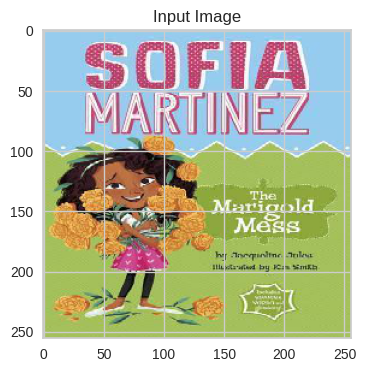

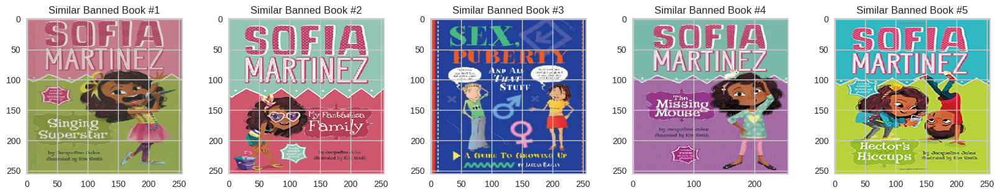

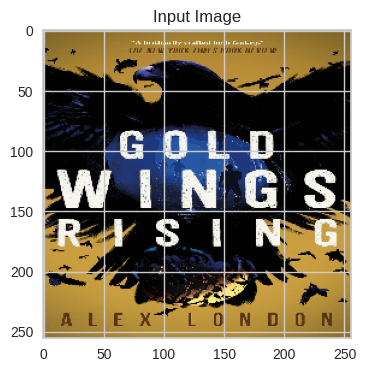

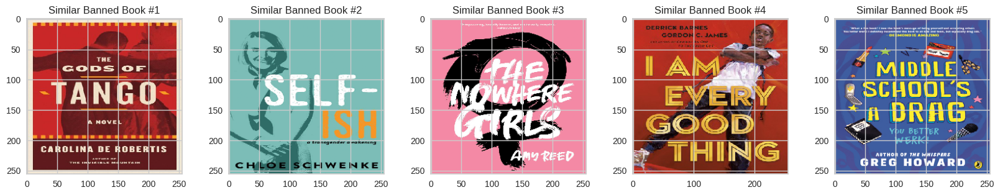

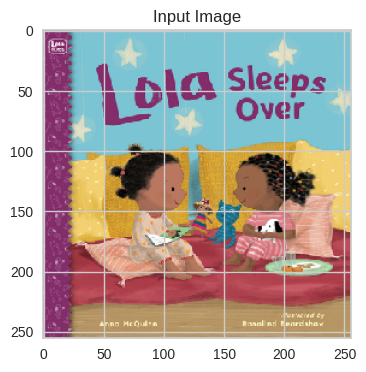

...

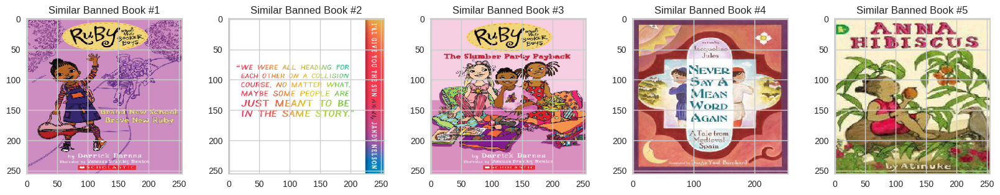

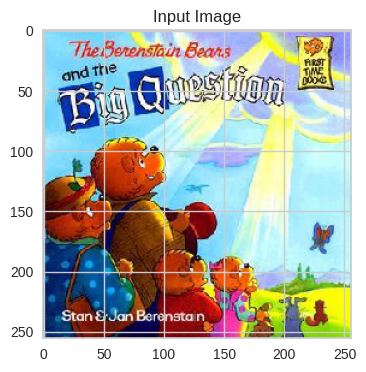

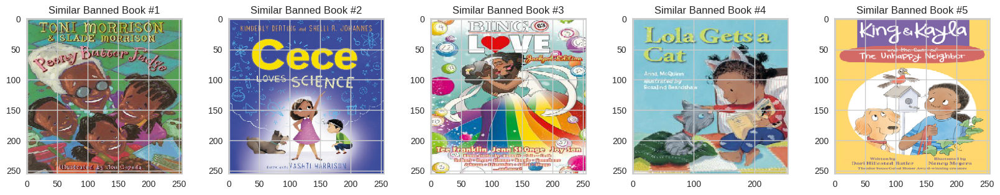

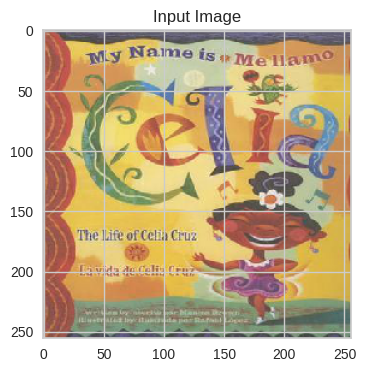

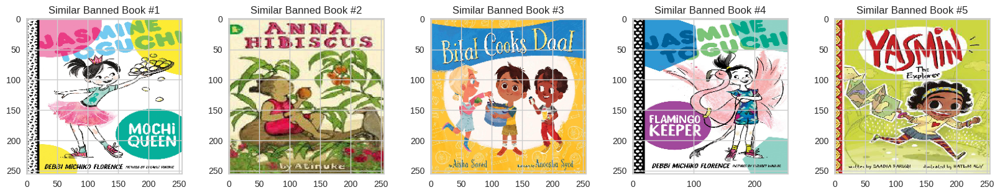

In [ ]:
for _ in range(10):
    i = random.randint(1,len(data))
    img1 = read_img(data.loc[i,'filename'])
    dist, index = knn_similarity_metrics(similarity_metric).kneighbors(X=X.iloc[i,:].values.reshape(1,-1))

    plt.figure(figsize = (4 , 4))
    plt.imshow(img1)
    plt.title("Input Image")

    plt.figure(figsize = (20 , 20))

    for i in range(1,6):
        plt.subplot(1 , 5, i)
        plt.subplots_adjust(hspace = 0.5 , wspace = 0.3)
        image = read_img(data.loc[index[0][i],'filename'])
        plt.imshow(image)
        plt.title(f'Similar Banned Book #{i}')